# Dicom loading and visualization

#### Load DICOM files

#### Libraries

In [6]:
import os
import pydicom
import numpy as np
import matplotlib.pyplot as plt
from typing import List
import cv2
import matplotlib.colors
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.animation import FuncAnimation


#### Aqui alojamos las funciones

In [65]:
def load_dicom_files(directory: str, file_extension: str = '.dcm'):
    """Load DICOM files from a specified directory that match the given file extension."""
    return [pydicom.dcmread(os.path.join(directory, f)) for f in os.listdir(directory) if f.endswith(file_extension)]

def sort_dicom_files_by_position(dicom_files):
    """Ordena archivos DICOM según la posición del paciente en la imagen."""
    return sorted(dicom_files, key=lambda x: float(x.ImagePositionPatient[2]))

def get_pixel_spacing(dicom):
    return dicom.PixelSpacing, dicom.SliceThickness

def sort_dicom_files(dicom_files):
    """Sort DICOM files by available headers, only including those with AcquisitionNumber equal to 2."""
    def get_sort_key(file):
        # Define sorting key: ImagePositionPatient (converted to a sortable form)
        position_patient = getattr(file, 'ImagePositionPatient', None)
        if position_patient:
            position_patient = float(position_patient[2])
        return position_patient if position_patient else 0

    # Filter to include only files with AcquisitionNumber equal to 2 --> With 3D Slicer we have seen is the correct one
    filtered_files = [file for file in dicom_files if getattr(file, 'AcquisitionNumber', None) == '2']
    
    '''
    Primero ordena por AcquisitionNumber y, dentro de cada número de adquisición, 
    ordena por la posición del paciente a lo largo del eje Z (ImagePositionPatient[2]).'''
    # Sort the filtered files by ImagePositionPatient along the Z-axis
    return sorted(filtered_files, key=get_sort_key)


def check_acquisition_uniformity(dicom_files: List[pydicom.Dataset]):
    """Check if all DICOM files have the same 'Acquisition Number'."""
    acquisition_numbers = {img.AcquisitionNumber for img in dicom_files}
    if len(acquisition_numbers) > 1:
        print("Multiple acquisition numbers found. Ensure all CT images are from a single acquisition.")
    else:
        print("Only a single acquisition")
    
def get_pixel_arrays(dicom_files: List[pydicom.Dataset]) -> np.ndarray:
    """Extract pixel arrays from sorted DICOM files and stack them into a single numpy array."""
    return np.stack([file.pixel_array for file in dicom_files])

def apply_cmap(img, cmap_name='bone'):
    """Apply a colormap to an image."""
    cmap = matplotlib.cm.get_cmap(cmap_name)
    normed_data = (img - np.min(img)) / (np.max(img) - np.min(img))
    mapped_data = cmap(normed_data)
    return (mapped_data[:, :, :3] * 255).astype(np.uint8)

def apply_alpha_fusion(dcm_img, seg_img, alpha=0.5, dcm_cmap='bone', seg_cmap='Set1'):
    """Apply alpha blending to two images."""
    dcm_img_colored = apply_cmap(dcm_img, cmap_name=dcm_cmap)
    seg_img_colored = apply_cmap(seg_img, cmap_name=seg_cmap)
    return cv2.addWeighted(dcm_img_colored, 1-alpha, seg_img_colored, alpha, 0)

def display_images(ct_image, seg_image):
    """Display CT and Segmentation images side-by-side."""
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.imshow(ct_image, cmap='gray', aspect='auto')
    plt.title('CT Slice')

    plt.subplot(1, 2, 2)
    plt.imshow(seg_image, cmap='gray', aspect='auto')
    plt.title('Segmentation Slice')
    plt.show()

def apply_window(image: np.ndarray, window_center: int, window_width: int) -> np.ndarray:
    """Apply window leveling to an image based on the given center and width."""
    lower_bound = window_center - 0.5 * window_width
    upper_bound = window_center + 0.5 * window_width
    return np.clip((image - lower_bound) / window_width, 0, 1)

In [87]:
# Data paths
# Windows
#ct_directory = "C:/Users/pedromarti/Documents/GitHub/Medial_Image_Pydicom/HCC_007/manifest-1643035385102/HCC-TACE-Seg/HCC_007/03-14-1998-NA-CT ABDOMEN WWO CONT-48924/4.000000-Recon 2 3 PHASE LIVER ABD-87008"
#seg_directory = "C:/Users/pedromarti/Documents/GitHub/Medial_Image_Pydicom/HCC_007/manifest-1643035385102/HCC-TACE-Seg/HCC_007/12-27-1997-NA-AP LIVER PRT WWO-67834/300.000000-Segmentation-39839/1-1.dcm"

# Windows feina
ct_directory = "HCC_007/manifest-1643035385102/HCC-TACE-Seg/HCC_007/12-27-1997-NA-AP LIVER PRT WWO-67834/4.000000-Recon 2 LIVER 3 PHASE AP-28011/"
seg_directory = "HCC_007/manifest-1643035385102/HCC-TACE-Seg/HCC_007/12-27-1997-NA-AP LIVER PRT WWO-67834/300.000000-Segmentation-39839/1-1.dcm"
# Mac
#ct_directory = "HCC_007/manifest-1643035385102/HCC-TACE-Seg/HCC_007/12-27-1997-NA-AP LIVER PRT WWO-67834/4.000000-Recon 2 LIVER 3 PHASE AP-28011/"
#seg_directory = "HCC_007/manifest-1643035385102/HCC-TACE-Seg/HCC_007/12-27-1997-NA-AP LIVER PRT WWO-67834/300.000000-Segmentation-39839/1-1.dcm"


### Cargamos las imagenes y las ordenamos

Cargamos y ordenamos las imagenes CT. Como ya hemos visto en el 3D Slicer, cogemos la acquisition number 2.

In [4]:
# Load and process DICOM CT images
ct_files = load_dicom_files(ct_directory)
sorted_ct_files = sort_dicom_files(ct_files)


Cargamos la segmentation image

In [5]:
# Load and process segmentation image
dicom_segmentation = pydicom.dcmread(seg_directory)
segmentation_image = dicom_segmentation.pixel_array

Simple visualización para saber que todo ha ido bien

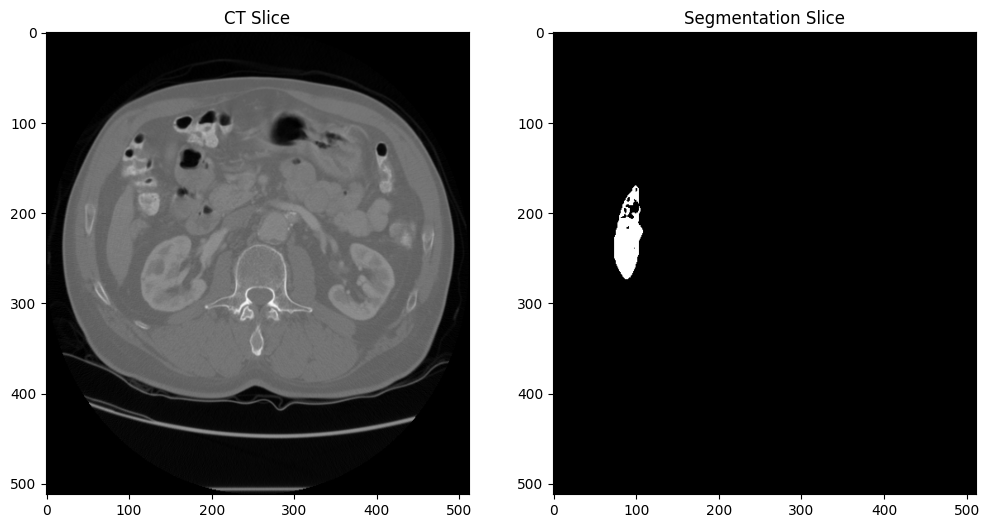

In [6]:
# Visualize a slice of CT and Segmentation images
ct_images = get_pixel_arrays(sorted_ct_files)
display_images(ct_images[8], segmentation_image[8])


Como sabemos que tiene 4 regiones en la segmentación y 300 registros, dividimos 300/4 y así sabemos que cada región tiene 75 registros.

#### Estudio de encabezados

In [7]:
# Print details and dimensions
print("Details of CT images sorted by Image Position Patient:")
for img in sorted_ct_files:
    print(f"Acquisition Number: {img.AcquisitionNumber}, Image Position Patient: {img.ImagePositionPatient}")

print("Dimensiones del arreglo de segmentación:", segmentation_image.shape)
print("Dimensiones del arreglo de imágenes CT:", ct_images.shape)

Details of CT images sorted by Image Position Patient:
Acquisition Number: 2, Image Position Patient: [-192.500000, -180.000000, -240.000000]
Acquisition Number: 2, Image Position Patient: [-192.500000, -180.000000, -237.500000]
Acquisition Number: 2, Image Position Patient: [-192.500000, -180.000000, -235.000000]
Acquisition Number: 2, Image Position Patient: [-192.500000, -180.000000, -232.500000]
Acquisition Number: 2, Image Position Patient: [-192.500000, -180.000000, -230.000000]
Acquisition Number: 2, Image Position Patient: [-192.500000, -180.000000, -227.500000]
Acquisition Number: 2, Image Position Patient: [-192.500000, -180.000000, -225.000000]
Acquisition Number: 2, Image Position Patient: [-192.500000, -180.000000, -222.500000]
Acquisition Number: 2, Image Position Patient: [-192.500000, -180.000000, -220.000000]
Acquisition Number: 2, Image Position Patient: [-192.500000, -180.000000, -217.500000]
Acquisition Number: 2, Image Position Patient: [-192.500000, -180.000000, -

Ahora ya tenemos la acquisition que mejor queda con nuestra segmentación.

In [8]:
check_acquisition_uniformity(sorted_ct_files)

Only a single acquisition


#### Aplicamos windowing a las imagenes para mejorarlas

In [9]:
# Windowing parameters
window_center, window_width = 40, 400
windowed_ct_images = np.array([apply_window(img, window_center, window_width) for img  in ct_images])

In [10]:
# Tomamos el primer archivo DICOM para obtener los metadatos
first_dicom_file = sorted_ct_files[0]  

# Obtener información del voxel
pixel_spacing = first_dicom_file.PixelSpacing  # Lista: [tamaño del pixel en X, tamaño del pixel en Y]
slice_thickness = first_dicom_file.SliceThickness  # Espesor de la rebanada en direccion Z

# Calcular las proporciones de aspecto
aspect_ratio_coronal = slice_thickness / pixel_spacing[0]
aspect_ratio_sagittal = slice_thickness / pixel_spacing[1]

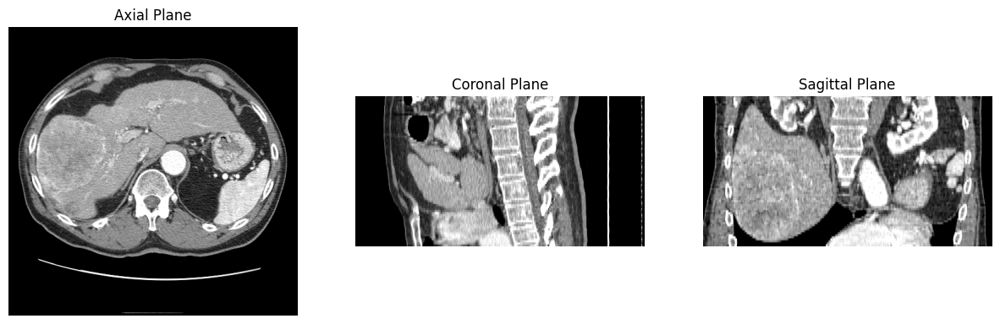

In [11]:
import matplotlib.pyplot as plt

def visualize_planes(ct_volume: np.ndarray):
    """Visualize axial, coronal, and sagittal planes of a CT volume with corrected aspect ratios."""
    # Determinar los planos
    axial_plane = ct_volume[ct_volume.shape[0] // 2, :, :]
    coronal_plane = ct_volume[:, :, ct_volume.shape[2] // 2]
    sagittal_plane = ct_volume[:, ct_volume.shape[1] // 2, :]

    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    
    # Visualizar el plano Axial
    axes[0].imshow(axial_plane, cmap='gray')
    axes[0].set_title('Axial Plane')
    axes[0].axis('off')

    # Visualizar el plano Coronal con la proporción de aspecto corregida
    axes[1].imshow(coronal_plane, cmap='gray', aspect=aspect_ratio_coronal)
    axes[1].set_title('Coronal Plane')
    axes[1].axis('off')

    # Visualizar el plano Sagital con la proporción de aspecto corregida
    axes[2].imshow(sagittal_plane, cmap='gray', aspect=aspect_ratio_sagittal)
    axes[2].set_title('Sagittal Plane')
    axes[2].axis('off')

    plt.show()

visualize_planes(windowed_ct_images)

#### Aplying alpha-fusion

In [12]:
# Cargamos los registros a su region
img_liver = segmentation_image[1:75,:,:]
img_mass = segmentation_image[76:150,:,:]
img_portal_vein = segmentation_image[151:225,:,:]
img_abdominal_aorta = segmentation_image[226:300,:,:]

img_segmented = (img_liver*1) + (img_mass*2) + (img_portal_vein*3) + (img_abdominal_aorta*4)

Visualising the four areas of interest

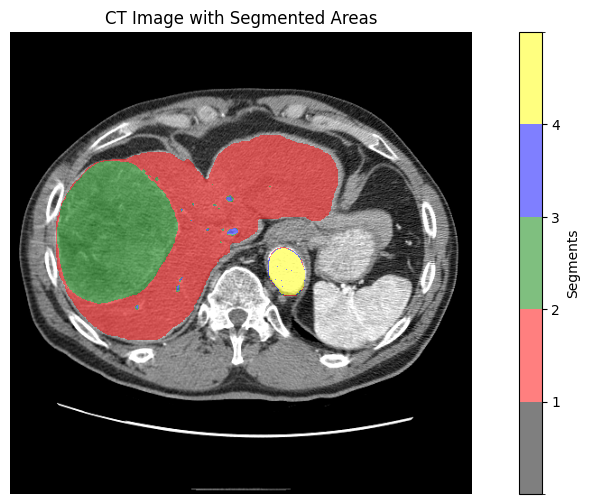

In [13]:
import matplotlib.colors as mcolors

# Colormap para las segmentaciones
cmap = mcolors.ListedColormap(['none', 'red', 'green', 'blue', 'yellow'])  # 'none' es para transparencia
bounds = [0, 1, 2, 3, 4, 5]
norm = mcolors.BoundaryNorm(bounds, cmap.N)

def plot_ct_with_segmentations(ct_image, segmentation):
    plt.figure(figsize=(12, 6))

    # Mostrar imagen CT
    plt.imshow(ct_image, cmap='gray')

    # Superponer la segmentación
    plt.imshow(segmentation, cmap=cmap, norm=norm, alpha=0.5)  # Alpha para transparencia

    plt.title('CT Image with Segmented Areas')
    plt.axis('off')
    plt.colorbar(ticks=[1, 2, 3, 4], label='Segments')
    plt.show()

slice_index = 48 # Índice de la slice a visualizar
plot_ct_with_segmentations(windowed_ct_images[slice_index, :, :], img_segmented[slice_index, :, :])

#### Prueba: Superposición de las CT sobre la segmentada 

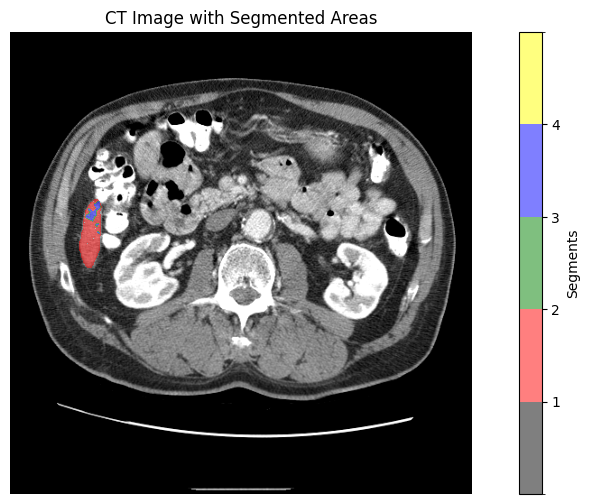

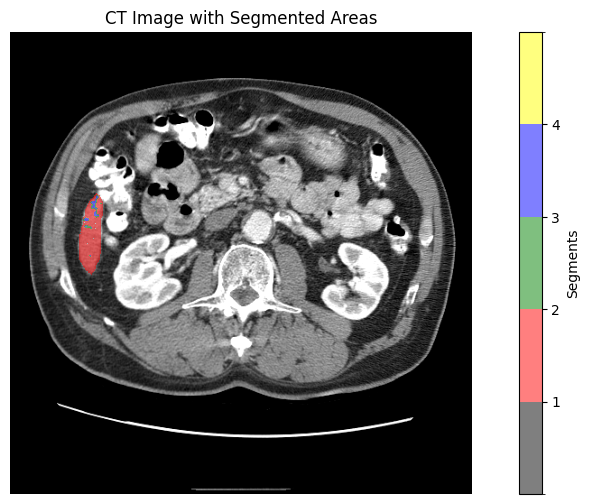

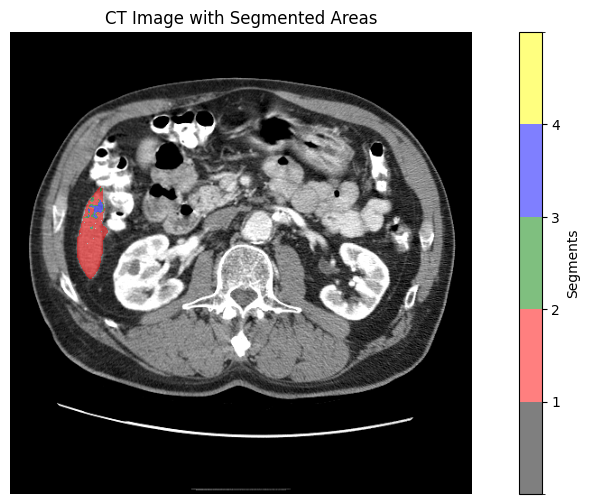

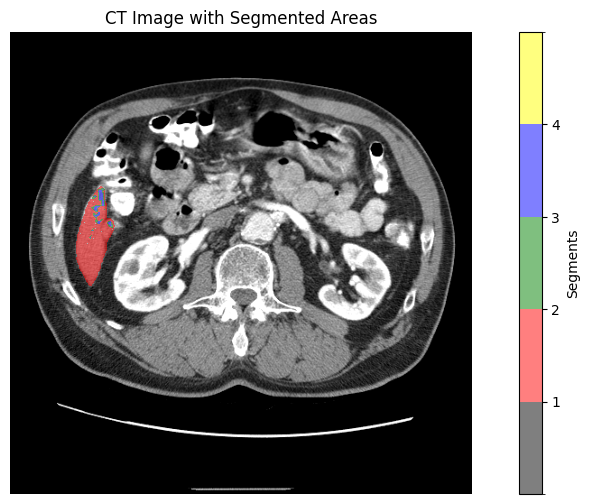

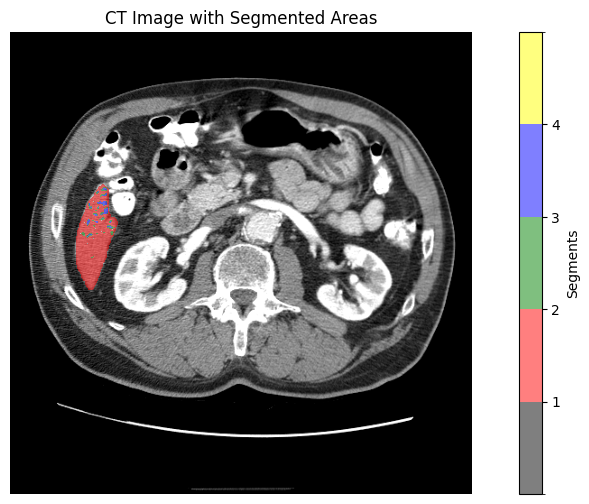

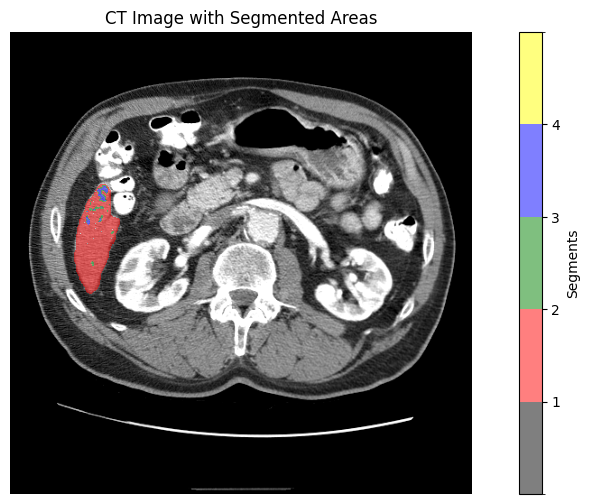

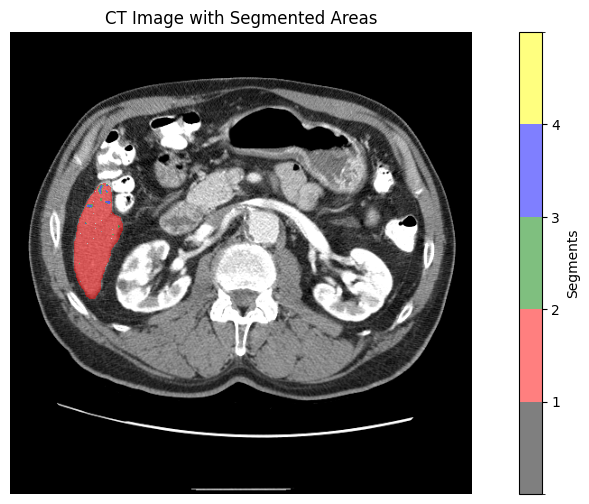

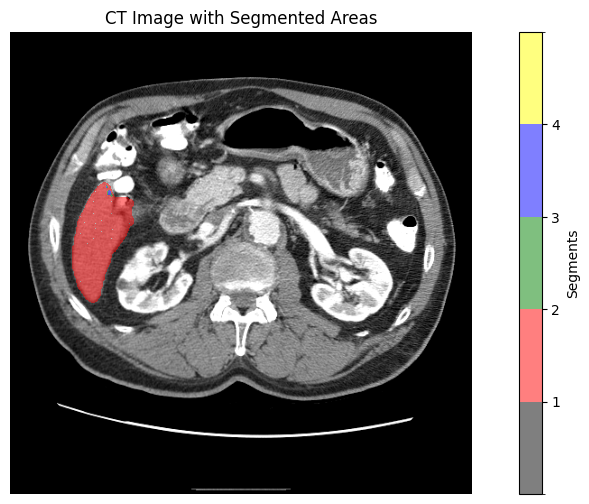

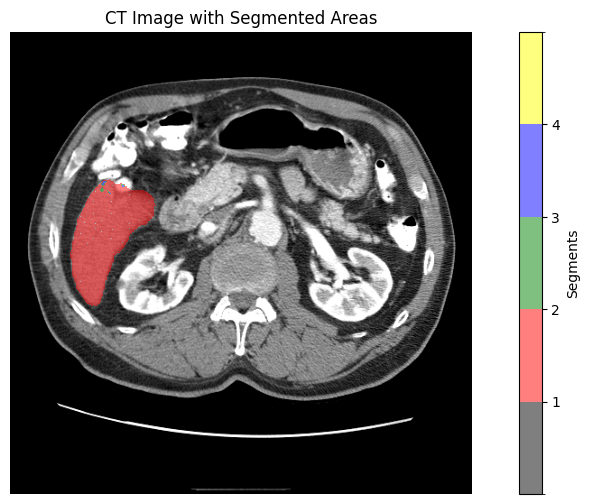

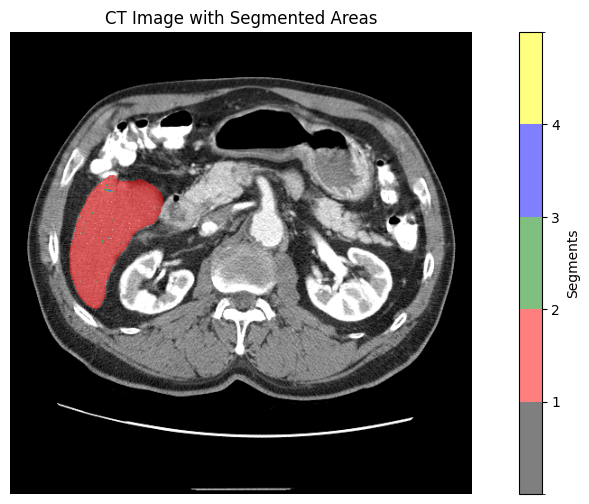

Segmentation array loaded with shape: (300, 512, 512)


In [14]:
# Visualize images and segmentations
for i in range(10):  # Example for the first 10 slices
    plot_ct_with_segmentations(windowed_ct_images[i+5, :, :], img_segmented[i+5, :, :])
print("Segmentation array loaded with shape:", segmentation_image.shape)

#### MIP

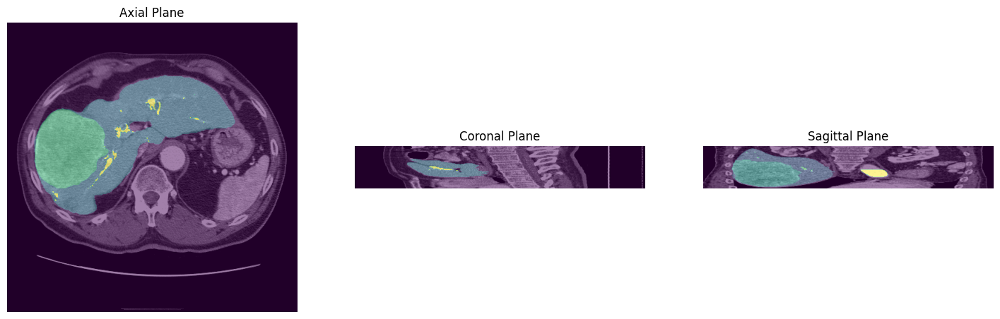

In [15]:
import numpy as np
import matplotlib.pyplot as plt

def plot_segmented_planes(ct_images, segmentation_images):
    # Extraer los cortes para cada plano
    axial_slice = ct_images[ct_images.shape[0] // 2, :, :]
    coronal_slice = ct_images[:, :, ct_images.shape[2] // 2]
    sagittal_slice = ct_images[:, ct_images.shape[1] // 2, :]

    # Extraer las segmentaciones para cada plano
    axial_seg = segmentation_images[ct_images.shape[0] // 2, :, :]
    coronal_seg = segmentation_images[:, :, ct_images.shape[2] // 2]
    sagittal_seg = segmentation_images[:, ct_images.shape[1] // 2, :]

    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    # Visualizar el plano Axial
    axes[0].imshow(axial_slice, cmap='gray')
    axes[0].imshow(axial_seg, cmap='viridis', alpha=0.5)
    axes[0].set_title('Axial Plane')
    axes[0].axis('off')

    # Visualizar el plano Coronal
    axes[1].imshow(coronal_slice, cmap='gray', aspect=aspect_ratio_coronal)
    axes[1].imshow(coronal_seg, cmap='viridis', alpha=0.5)
    axes[1].set_title('Coronal Plane')
    axes[1].axis('off')

    # Visualizar el plano Sagital
    axes[2].imshow(sagittal_slice, cmap='gray', aspect=aspect_ratio_sagittal)
    axes[2].imshow(sagittal_seg, cmap='viridis', alpha=0.5)
    axes[2].set_title('Sagittal Plane')
    axes[2].axis('off')

    plt.show()

plot_segmented_planes(windowed_ct_images, img_segmented)

In [16]:
def calculate_mip(volume, axis):
    """Calculate the Maximum Intensity Projection (MIP) along a given axis."""
    return np.max(volume, axis=axis)

def create_mips(ct_volume, segmentation_volume):
    """Calculate MIPs for all three planes and display them with a lilac color theme, including segmentations."""
    # Calcular MIPs para las imágenes CT
    mip_axial_ct = calculate_mip(ct_volume, axis=0)
    mip_coronal_ct = calculate_mip(ct_volume, axis=1)
    mip_sagittal_ct = calculate_mip(ct_volume, axis=2)
    
    # Calcular MIPs para las segmentaciones
    mip_axial_seg = calculate_mip(segmentation_volume, axis=0)
    mip_coronal_seg = calculate_mip(segmentation_volume, axis=1)
    mip_sagittal_seg = calculate_mip(segmentation_volume, axis=2)

    return mip_axial_ct, mip_coronal_ct, mip_sagittal_ct, mip_axial_seg, mip_coronal_seg, mip_sagittal_seg

def display_mip_images(mip_axial_ct, mip_coronal_ct, mip_sagittal_ct, mip_axial_seg, mip_coronal_seg, mip_sagittal_seg):
    """Display MIP images for axial, coronal, and sagittal planes with customized color."""
    plt.figure(figsize=(18, 6))

    # Colormap personalizado que tiende al lila
    cmap = plt.get_cmap('twilight')
    cmap_seg = plt.get_cmap('viridis')  # Use a distinct colormap for segmentation overlay

    # Definir los percentiles para ajustar los valores de visualización de cada MIP
    vmin_a, vmax_a = np.percentile(mip_axial_ct, [2, 98])
    vmin_c, vmax_c = np.percentile(mip_coronal_ct, [2, 98])
    vmin_s, vmax_s = np.percentile(mip_sagittal_ct, [2, 98])

    # Axial
    plt.subplot(1, 3, 1)
    plt.imshow(mip_axial_ct, cmap=cmap, aspect='auto', vmin=vmin_a, vmax=vmax_a, origin='lower')
    plt.imshow(mip_axial_seg, cmap=cmap_seg, aspect='auto', alpha=0.7, origin='lower')
    plt.title('MIP Axial')
    plt.axis('off')

    # Coronal
    plt.subplot(1, 3, 2)
    plt.imshow(mip_coronal_ct, cmap=cmap, aspect=aspect_ratio_coronal, vmin=vmin_c, vmax=vmax_c, origin='lower')
    plt.imshow(mip_coronal_seg, cmap=cmap_seg, aspect=aspect_ratio_coronal, alpha=0.7, origin='lower')
    plt.title('MIP Coronal')
    plt.axis('off')

    # Sagittal
    plt.subplot(1, 3, 3)
    plt.imshow(mip_sagittal_ct, cmap=cmap, aspect=aspect_ratio_sagittal, vmin=vmin_s, vmax=vmax_s, origin='lower')
    plt.imshow(mip_sagittal_seg, cmap=cmap_seg, aspect=aspect_ratio_sagittal, alpha=0.7, origin='lower')
    plt.title('MIP Sagittal')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

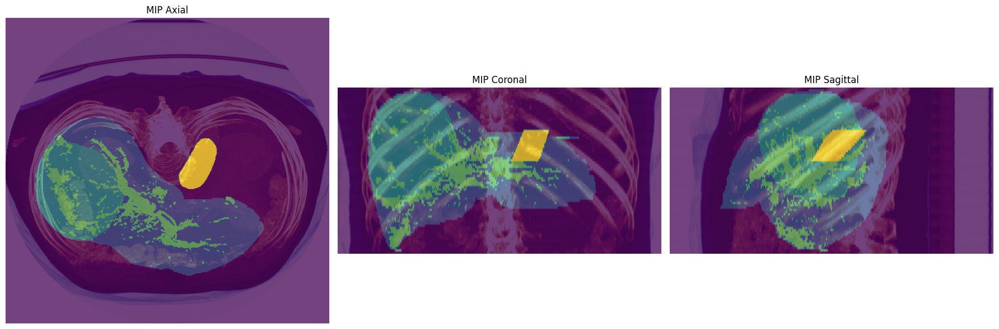

In [32]:
mip_axial_ct, mip_coronal_ct, mip_sagittal_ct, mip_axial_seg, mip_coronal_seg, mip_sagittal_seg = create_mips(ct_images, img_segmented)
display_mip_images(mip_axial_ct, mip_coronal_ct, mip_sagittal_ct, mip_axial_seg, mip_coronal_seg, mip_sagittal_seg)

### Animation

Ho he guardat a --> 'results/MIP\Animation.gif'


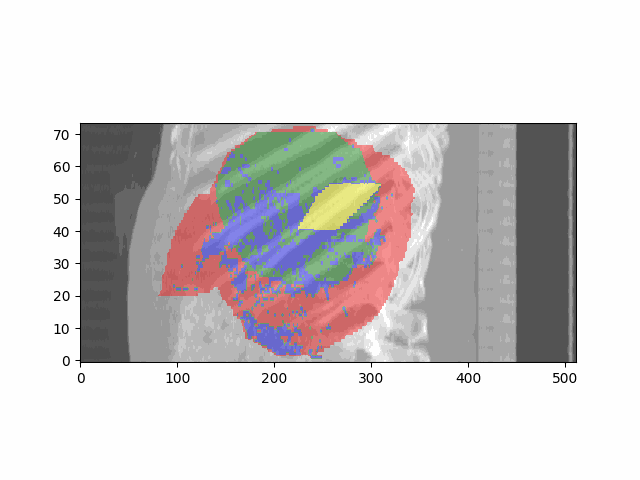

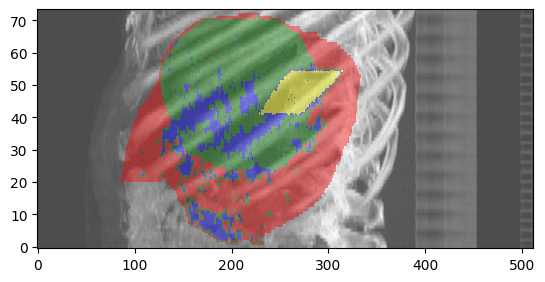

In [40]:
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import pydicom
import scipy.ndimage

# Funciones para obtener planos MIP
def MIP_sagittal_plane(volume):
    return np.max(volume, axis=2)

def MIP_coronal_plane(volume):
    return np.max(volume, axis=1)

def rotate_on_axial_plane(volume, angle):
    """Rotar volumen en el plano axial."""
    return scipy.ndimage.rotate(volume, angle, axes=(1, 2), reshape=False)


def crop_volume(volume, start_slice, crop_slices):
    """Recortar el volumen para eliminar el ruido en los bordes."""
    return volume[:, :, start_slice:crop_slices]

def plot_3d_combined(ct_image, seg_image, pixel_len_mm, n=16, output_path='results/MIP'):
    """Plot 3D visualization of CT data and segmentation data."""
    os.makedirs(output_path, exist_ok=True)
    projections = []

    # Recortar el volumen para eliminar el ruido en los bordes
    #ct_image = crop_volume(ct_image, 50, 450)
    #seg_image = crop_volume(seg_image, 50, 450)

    # Crear y guardar las proyecciones MIP
    for idx, alpha in enumerate(np.linspace(0, 360, num=n, endpoint=False)):
        rotated_ct_img = rotate_on_axial_plane(ct_image, alpha)
        rotated_seg_img = rotate_on_axial_plane(seg_image, alpha)

        projection_ct = MIP_sagittal_plane(rotated_ct_img)
        projection_seg = MIP_sagittal_plane(rotated_seg_img)

        # Guardar las proyecciones
        projections.append((projection_ct, projection_seg))
        plt.figure(figsize=(18, 6))
        plt.imshow(projection_ct, cmap='gray', aspect=pixel_len_mm[0] / pixel_len_mm[1], alpha=0.7, origin='lower')
        plt.imshow(projection_seg, cmap=cmap, aspect=pixel_len_mm[0] / pixel_len_mm[1], alpha=0.4, origin='lower')
        plt.title(f'Projection {idx}')
        plt.axis('off')

        # Legend elements
        handles = [plt.Line2D([0], [0], color=cmap(i), lw=4) for i in range(1, 5)]
        labels = ['Liver', 'Mass', 'Portal Vein', 'Abdominal Aorta']
        plt.legend(handles, labels, loc='upper right')

        plt.savefig(f'{output_path}/Projection_{idx}.png')
        plt.close()

    # Crear la animación GIF
    fig, ax = plt.subplots()
    ani_frames = [
        [ax.imshow(proj[0], cmap='gray', aspect=pixel_len_mm[0] / pixel_len_mm[1], animated=True, alpha=0.7, origin='lower'),
         ax.imshow(proj[1], cmap=cmap,  aspect=pixel_len_mm[0] / pixel_len_mm[1], animated=True, alpha=0.4, origin='lower')]
        for proj in projections
    ]
    anim = animation.ArtistAnimation(fig, ani_frames, interval=100, blit=True)
    gif_path = os.path.join(output_path, 'Animation.gif')
    anim.save(gif_path, writer='pillow')  # Use 'pillow' instead of 'imagemagick'

    print(f"Ho he guardat a --> '{gif_path}'")
    return gif_path

# Configurar el colormap para las segmentaciones
cmap = mcolors.ListedColormap(['none', 'red', 'green', 'blue', 'yellow'])  # 'none' es para transparencia
bounds = [0, 1, 2, 3, 4, 5]
norm = mcolors.BoundaryNorm(bounds, cmap.N)

pixel_len_mm = [3.27, 0.98, 0.98] # Pixel length in mm [z, y, x]

# Crear y guardar la animación
gif_path = plot_3d_combined(ct_images, img_segmented, pixel_len_mm, n=64)

# Mostrar el GIF en el notebook
from IPython.display import Image
display(Image(filename=gif_path))

# Image Coregistration

#### Loading and Preprocessing the Images

In [168]:
from pydicom import dcmread
import pylibjpeg
from scipy.optimize import minimize
from scipy.spatial.transform import Rotation as R
import numpy as np
from scipy.ndimage import affine_transform, zoom
import matplotlib.pyplot as plt
import pydicom
import os

In [169]:
reference_image_path = "Project/icbm_avg_152_t1_tal_nlin_symmetric_VI.dcm"
input_images_path = "Project/RM_Brain_3D-SPGR"
atlas_path = "Project/AAL3_1mm.dcm"

In [170]:
input_images_dicom = sort_dicom_files_by_position(load_dicom_files(input_images_path))
reference_image_dicom = dcmread(reference_image_path)
atlas_image_dicom = dcmread(atlas_path)

# Convert to numpy arrays for processing
input_images = np.array([img.pixel_array for img in input_images_dicom])
reference_image = reference_image_dicom.pixel_array
atlas_image = atlas_image_dicom.pixel_array

print("Reference image shape:", reference_image.shape)
print("Input image shape:", input_images.shape)
print("Atlas image shape:", atlas_image.shape)

Reference image shape: (193, 229, 193)
Input image shape: (212, 512, 512)
Atlas image shape: (181, 217, 181)


Visualisation of the images

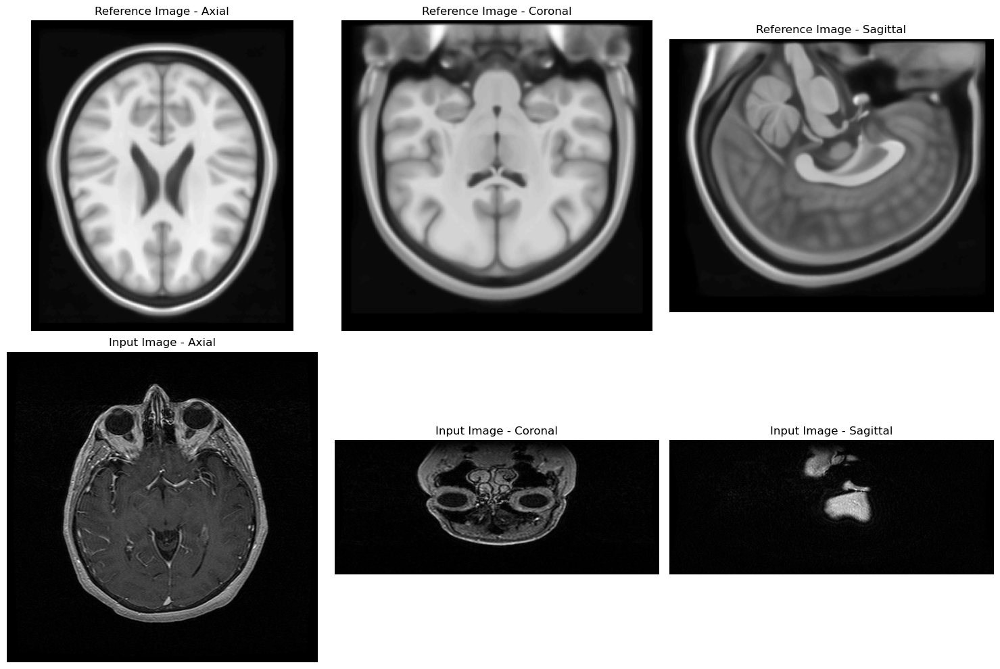

In [171]:
def visualize_comparative_slices(image1, image2, slice_types=('axial', 'coronal', 'sagittal'), titles=('Reference Image', 'Input Image')):
    """
    Displays comparative slices from two images in axial, coronal, and sagittal planes.
    """
    # Indices for middle slices
    slices = {
        'axial': image1.shape[0] // 2,
        'coronal': image1.shape[1] // 2,
        'sagittal': image1.shape[2] // 2
    }

    # Setting up the figure and axes
    fig, axes = plt.subplots(nrows=2, ncols=len(slice_types), figsize=(5 * len(slice_types), 10))

    for idx, slice_type in enumerate(slice_types):
        # Reference image slice
        ax1 = axes[0, idx]
        ax1.imshow(image1[slices[slice_type], :, :] if slice_type == 'axial' else image1[:, slices[slice_type], :] if slice_type == 'coronal' else image1[:, :, slices[slice_type]], cmap='gray')
        ax1.set_title(f'{titles[0]} - {slice_type.capitalize()}')
        ax1.axis('off')

        # Input image slice
        ax2 = axes[1, idx]
        ax2.imshow(image2[slices[slice_type], :, :] if slice_type == 'axial' else image2[:, slices[slice_type], :] if slice_type == 'coronal' else image2[:, :, slices[slice_type]], cmap='gray')
        ax2.set_title(f'{titles[1]} - {slice_type.capitalize()}')
        ax2.axis('off')

    plt.tight_layout()
    plt.show()

# Usage of the function with example images
visualize_comparative_slices(reference_image, input_images)


Con estos resultados podemos ver que las dos imágenes tienen una orientación diferente. Para alinearlas, tendremos que tener en cuenta esta diferencia. Es por ello que vamos a aplicar un alineamiento inicial.

**MATCHING DIMENSIONALITY**

si feim q els dos tensors siguin 128x128, me farà que sigui idferent --> Tensor de mides diferents pero s'objecte 
- mida de cada pxel fisica (pixel sppacing --> en cada slice com te mous en x,y) slice_thinkes --> en en y,z

In [172]:
def crop_image(img, target_shape):
    """
    Crops an image to a specified target shape by calculating the cropping indices
    directly and applying them to slice the numpy array. This version aims to use
    direct slicing for an intuitive understanding and avoids the explicit loop.
    """
    # Calculate start and end indices for each dimension to ensure the crop is centered
    start_indices = [(s - t) // 2 for s, t in zip(img.shape, target_shape)]
    end_indices = [start + t for start, t in zip(start_indices, target_shape)]

    # Prepare slice objects for each dimension
    slices = tuple(slice(start, end) for start, end in zip(start_indices, end_indices))

    # Crop the image using calculated slices
    cropped_img = img[slices]

    return cropped_img


def get_pixel_spacing_and_thickness(dicom):
    """
    Extracts PixelSpacing and SliceThickness from a DICOM file.
    Converts them from DSfloat to regular float or tuple of floats.
    """
    try:
        pixel_spacing = tuple(map(float, dicom.PixelSpacing)) if dicom.PixelSpacing else (None, None)
        slice_thickness = float(dicom.SliceThickness) if dicom.SliceThickness else None
    except AttributeError:
        print("DICOM file is missing necessary attributes.")
        pixel_spacing, slice_thickness = (None, None), None

    print("---- Header information ----")
    print(f" - PixelSpacing: {pixel_spacing}")
    print(f" - SliceThickness: {slice_thickness}")
    return pixel_spacing, slice_thickness

def match_dimension(images, shape, interpolation=cv2.INTER_LINEAR):
    """Matching dimensions with a given shape"""
        # Create an empty array to hold the resized images
    resized_stack = np.empty((images.shape[0], shape[1], shape[0]), dtype=images.dtype)

    # Resize each slice and store in the new array
    for i, img in enumerate(images):
        resized_stack[i] = cv2.resize(img, shape, interpolation=interpolation)

    return resized_stack


Input Image Pixel Spacing and Slice Thickness for first image:
---- Header information ----
 - PixelSpacing: (0.5078, 0.5078)
 - SliceThickness: 2.0

Resampling images..
Resampled reference image shape: (181, 217, 181)
Resampled input image shape: (181, 217, 181)
Atlas image shape (not resampled): (181, 217, 181)


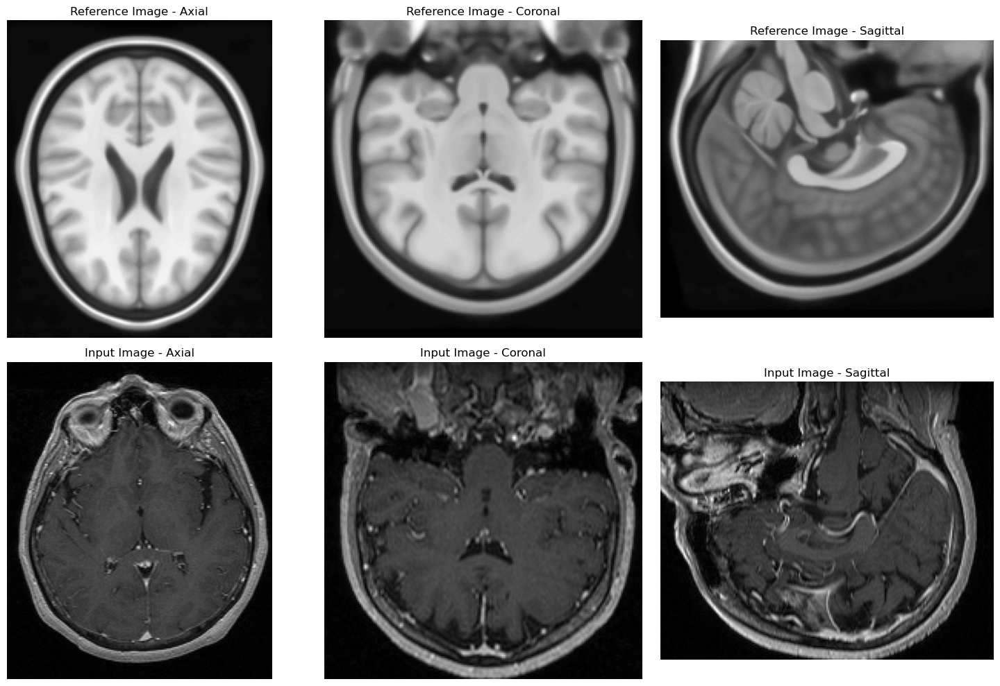

In [173]:
# Stack the 2D slices into a 3D volume
input_images_volume = np.stack(input_images)

# Getting PixelSpacing and Thickness for match dimensions
print(f"\nInput Image Pixel Spacing and Slice Thickness for first image:")
pixel_spacing, slice_thickness = get_pixel_spacing_and_thickness(input_images_dicom[0])

reference_image_croped = crop_image(reference_image, atlas_image.shape) # Matching dimensions with atlas image
input_images_reshaped = match_dimension(input_images_volume,(int(input_images_volume.shape[1] * pixel_spacing[0]), int(input_images_volume.shape[2] * pixel_spacing[1])))
input_images_cropped = crop_image(input_images_reshaped, reference_image_croped.shape)

# Normalize images
reference_image_norm = reference_image_croped / np.max(reference_image_croped)
input_images_norm = input_images_cropped / np.max(input_images_cropped)

print("\nResampling images..")
print("Resampled reference image shape:", reference_image_norm.shape)
print("Resampled input image shape:", input_images_norm.shape)
print("Atlas image shape (not resampled):", atlas_image.shape)
visualize_comparative_slices(reference_image_norm, input_images_norm)

#### Rigid motion & loss function

In [211]:
import quaternion
import scipy.ndimage

# Compute MSE between reference image and transformed
def compute_mse(fixed, moving):
    return np.mean((fixed - moving) ** 2)

def calculate_center(image):
    """Calculate the geometric center of a 3D image."""
    return np.array(image.shape) / 2

def rigid_transform(image, params, output_shape):
    """Apply a rigid transformation using quaternions for rotation and a vector for translation."""
    if len(params) != 7:
        raise ValueError("Parameter array must have 7 elements: 4 for quaternion and 3 for translation.")

    # Unpack quaternion and translation from params
    q = np.quaternion(params[0], params[1], params[2], params[3])
    translation = np.array(params[4:7])
    
    # Normalize the quaternion to ensure it represents a rotation
    q_normalized = q / np.abs(q)
    
    # Convert the quaternion to a rotation matrix
    rotation_matrix = quaternion.as_rotation_matrix(q_normalized)
    
    # Calculate transformation offset
    center = calculate_center(image)
    rotated_center = np.dot(rotation_matrix, center)
    offset = translation - rotated_center + center

    # Perform affine transformation
    transformed_image = affine_transform(
        image,
        rotation_matrix,
        offset=offset,
        output_shape=output_shape,
        order=3,
        mode='constant',
        cval=0.0
    )
    return transformed_image

def objective_function(params, fixed_image, moving_image):
    """Calculate the MSE between the fixed image and a transformed moving image."""
    transformed_image = rigid_transform(moving_image, params, fixed_image.shape)
    return compute_mse(fixed_image, transformed_image)

def coregistration(method, options):
    """Perform image registration using optimization to minimize MSE."""
    initial_params = np.array([1, 0, 0, 0, 0, 0, 0])  # Identity quaternion and zero translation
    result = minimize(
        objective_function, 
        initial_params,
        args=(reference_image_norm, input_images_norm),
        method=method, 
        options=options
    )
    return result

def apply_transformation(image, parameters, reference_image, plot=True):
    """Apply the optimal transformation and visualize the results."""
    transformed_image = rigid_transform(image, parameters, reference_image.shape)
    if plot:
        visualize_comparative_slices(reference_image, transformed_image)
    return transformed_image

def debug_transformation(reference_image, transformed_image, title='Transformation Debug'):
    """
    Function to display side-by-side comparison to help identify issues in the transformation process.
    """
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    axes[0].imshow(reference_image[reference_image.shape[1] // 2], cmap='gray')
    axes[0].set_title('Reference Image - Axial')
    axes[1].imshow(transformed_image[transformed_image.shape[1] // 2], cmap='gray')
    axes[1].set_title('Transformed Image - Axial')
    axes[2].imshow(np.abs(reference_image[reference_image.shape[1] // 2] - transformed_image[transformed_image.shape[1] // 2]), cmap='hot')
    axes[2].set_title('Difference Image - Axial')
    for ax in axes:
        ax.axis('off')
    plt.tight_layout()
    plt.show()


def apply_predefined_rotation(image, rotation_angles):
    """
    Apply predefined rotations to the image using quaternions.
     - image: 3D numpy array of the image to be transformed.
     - rotation_angles: Tuple of angles (in radians) to rotate around each axis (x, y, z).
    """
    # Creation the rotation matrices for rotations around the x and z axes
    rot_x = np.array([
        [1, 0, 0],
        [0, np.cos(rotation_angles[0]), -np.sin(rotation_angles[0])],
        [0, np.sin(rotation_angles[0]), np.cos(rotation_angles[0])]
    ])
    
    rot_z = np.array([
        [np.cos(rotation_angles[2]), -np.sin(rotation_angles[2]), 0],
        [np.sin(rotation_angles[2]), np.cos(rotation_angles[2]), 0],
        [0, 0, 1]
    ])

    # Convert quaternion to rotation matrix
    rotation_matrix = np.dot(rot_z, rot_x)
    
    # Calculate center and offset for transformation
    center = calculate_center(image)
    rotated_center = np.dot(rotation_matrix, center)
    offset = -rotated_center + center
    
    # Perform the transformation
    rotated_image = affine_transform(
        image, 
        rotation_matrix, 
        offset=offset, 
        output_shape=image.shape, 
        order=3, 
        mode='constant', 
        cval=0.0
    )
    return rotated_image
import matplotlib.pyplot as plt

def visualize_coronal_slices(image1, image2, title1='Reference Image - Coronal Slice', title2='Transformed Image - Coronal Slice'):
    """
    Visualize coronal plane slices of two images side by side.
    Args:
        image1 (numpy.ndarray): First image array (reference image).
        image2 (numpy.ndarray): Second image array (transformed input image).
        title1 (str): Title for the first image.
        title2 (str): Title for the second image.
    """
    # Calculate the index for the middle slice in the coronal plane
    coronal_slice_index = image1.shape[1] // 2

    # Set up the plotting environment
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))

    # Plotting the coronal slice of the first image
    ax1 = axes[0]
    ax1.imshow(image1[:, coronal_slice_index, :], cmap='gray')
    ax1.set_title(title1)
    ax1.axis('off')  # Hide the axis

    # Plotting the coronal slice of the second image
    ax2 = axes[1]
    ax2.imshow(image2[:, coronal_slice_index, :], cmap='gray')
    ax2.set_title(title2)
    ax2.axis('off')  # Hide the axis

    plt.tight_layout()
    plt.show()


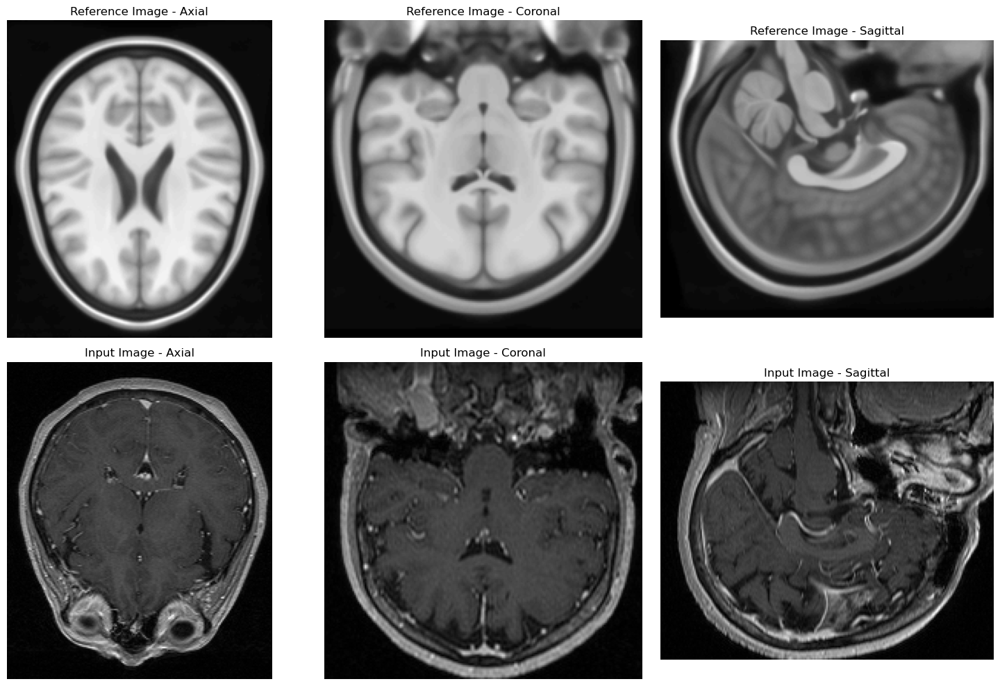

In [228]:
# Apply predefined rotations to the Nelder-Mead transformed image
#rotated_nm_image = apply_predefined_rotation(input_images_norm, (np.pi, 0, np.pi))
#rotated_reference_image = apply_predefined_rotation(reference_image_norm, (np.pi, 0, np.pi))
#rotated_nm_image = rigid_transform(input_images_norm, [0,0,0.5,np.pi, 0,0,0], reference_image_norm.shape)

rotated_image = np.flip(input_images_norm, axis=1)

visualize_comparative_slices(reference_image_norm, rotated_image)

#### Optimization of transform parameters

In [229]:

# Compute MSE before optimization
initial_mse = compute_mse(reference_image_norm, rotated_image)
print(f"Initial MSE: {initial_mse}")

# Optimize using BFGS
options_bfgs = {'maxiter': 500, 'gtol': 1e-6}
result_bfgs = coregistration('BFGS', options_bfgs)
optimized_params_bfgs = result_bfgs.x
mse_bfgs = compute_mse(reference_image_norm, rigid_transform(rotated_image, optimized_params_bfgs, reference_image_norm.shape))

# Optimize using Nelder-Mead
options_nm = {'maxiter': 500, 'xatol': 1e-6}
result_nm = coregistration('Nelder-Mead', options_nm)
optimized_params_nm = result_nm.x
mse_nm = compute_mse(reference_image_norm, rigid_transform(rotated_image, optimized_params_nm, reference_image_norm.shape))

# Print results
print(f"BFGS Optimization: MSE = {mse_bfgs}, Parameters = {optimized_params_bfgs}")
print(f"Nelder-Mead Optimization: MSE = {mse_nm}, Parameters = {optimized_params_nm}")

Initial MSE: 0.06396683519889057
BFGS Optimization: MSE = 0.06396683519889057, Parameters = [1. 0. 0. 0. 0. 0. 0.]
Nelder-Mead Optimization: MSE = 0.06395488914050722, Parameters = [ 1.01294041e+00 -4.51770740e-07  3.43398539e-08 -2.27624101e-07
  2.21116042e-04 -7.60686421e-05  1.16682785e-04]


Based on the results it appears that Nelder-Mead has given a better Mean Squared Error (MSE) than BFGS. Now we are going to viusailze the transformations.

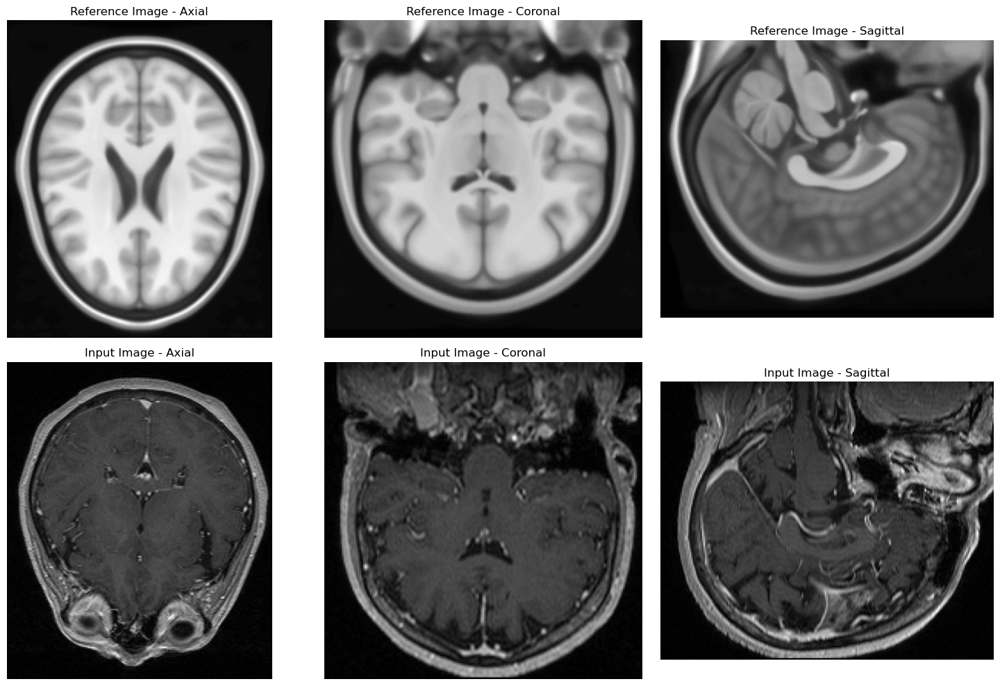

In [236]:
# Apply transformations using optimized parameters from Nelder-Mead
transformed_image_nm = rigid_transform(rotated_image, optimized_params_nm, reference_image_norm.shape)
visualize_comparative_slices(reference_image_norm, transformed_image_nm)

## Thalamus Region

/var/folders/gj/6tyw6rld1nn68w3tjknkqmkw0000gn/T/ipykernel_90539/60500070.py:16: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df = pd.read_csv(atlas_info_path, header=None, delim_whitespace=True)


Thalamus IDs: [81, 82, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150]


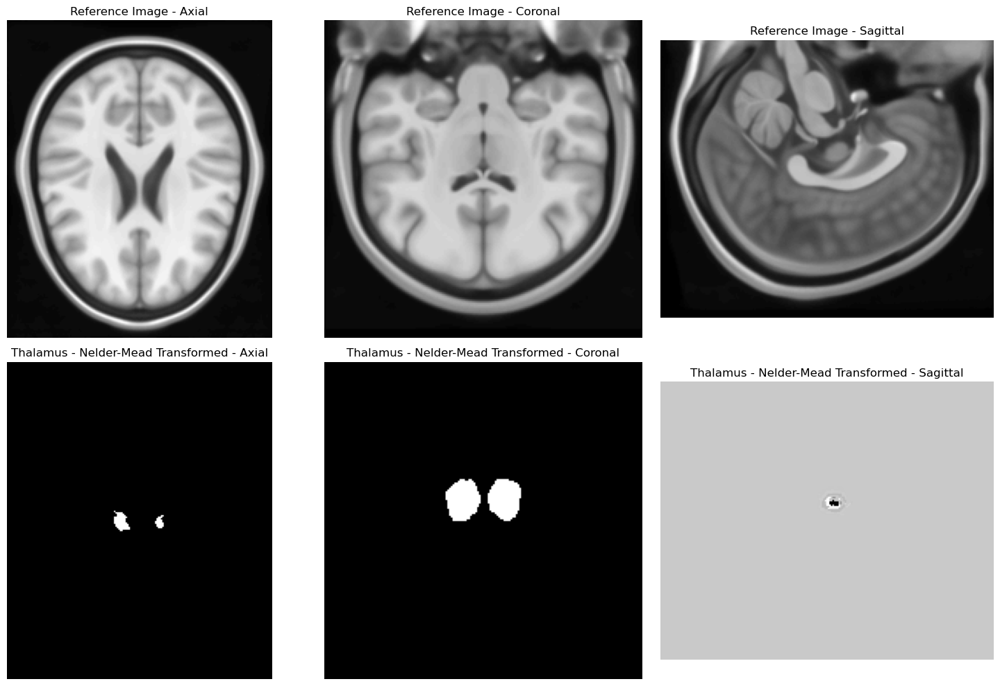

In [237]:
import numpy as np
import pandas as pd
import imageio

def create_gif(image_paths, gif_path, duration=0.1):
    images = []
    for filepath in image_paths:
        images.append(imageio.imread(filepath))
    
    imageio.mimsave(gif_path, images, duration=duration)


def extract_thalamus_ids(atlas_info_path):
    """ Extracts Thalamus IDs from a .txt file. """
    try:
        df = pd.read_csv(atlas_info_path, header=None, delim_whitespace=True)
        thalamus_ids = df[df[1].str.contains('Thal', na=False)][0].tolist()
    except Exception as e:
        print(f"Error reading the thalamus IDs: {e}")
        thalamus_ids = []
    return thalamus_ids

# Load thalamus IDs
thal_ids = extract_thalamus_ids('Project/AAL3_1mm.txt')
print("Thalamus IDs:", thal_ids)

# Transform the thalamus region to the input space
def transform_thalamus(atlas_image, thal_ids, parameters):
    thal_mask = np.isin(atlas_image, thal_ids)
    transformed_thal_mask = apply_transformation(thal_mask.astype(float), parameters, atlas_image, plot=False)
    return transformed_thal_mask

# Ensure you have the atlas_image loaded and the optimized_params_* from your optimization routines
transformed_thalamus_nm = transform_thalamus(atlas_image, thal_ids, optimized_params_nm)

# Visualize the thalamus region transformation
visualize_comparative_slices(reference_image_norm, transformed_thalamus_nm, slice_types=('axial', 'coronal', 'sagittal'), titles=('Reference Image', 'Thalamus - Nelder-Mead Transformed'))


/var/folders/gj/6tyw6rld1nn68w3tjknkqmkw0000gn/T/ipykernel_90539/771903468.py:49: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = matplotlib.cm.get_cmap(cmap_name)
/var/folders/gj/6tyw6rld1nn68w3tjknkqmkw0000gn/T/ipykernel_90539/60500070.py:8: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  images.append(imageio.imread(filepath))


GIF created at thalamus_transformation_coronal.gif


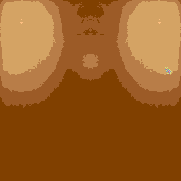

In [239]:
def save_coronal_fusion_images(reference_image, transformed_image, output_dir, alpha=0.5):
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    
    num_slices = reference_image.shape[1]  # Coronal slices
    filepaths = []
    
    for i in range(num_slices):
        fused_image = apply_alpha_fusion(reference_image[:, i, :], transformed_image[:, i, :], alpha=alpha)
        filepath = os.path.join(output_dir, f"fusion_coronal_{i:03d}.png")
        plt.imsave(filepath, fused_image)
        filepaths.append(filepath)
    
    return filepaths

# Applying the optimized transformation to the thalamus region
transformed_thalamus_nm = transform_thalamus(atlas_image, thal_ids, optimized_params_nm)

# Creating coronal alpha fusion images
output_dir = 'fusion_images_coronal'
image_paths = save_coronal_fusion_images(reference_image_norm, transformed_thalamus_nm, output_dir, alpha=0.5)

# Creating GIF
gif_path = 'thalamus_transformation_coronal.gif'
create_gif(image_paths, gif_path, duration=0.1)

print(f"GIF created at {gif_path}")
# Mostrar el GIF en el notebook
from IPython.display import Image
display(Image(filename=gif_path))